# Assignment 4. Color and Multi-Scale Representations

<span style="color:orange">Ground Rules for the Assignment: </span>

* <span style="color:lightblue"> You can only use basic functions (matrix operations, input/output image functions, plotters). Anything else, you need to code from scratch (histogram functions, inverting gamma functions, color matting, histogram equalization)</span>
* <span style="color:lightblue"> The code needs to be appropiately commented and should be reproducible; if we cannot re-generate your figures from your code, we will deduct points.</span>
* <span style="color:lightblue">The notebook report should be detailed and include partial and final solutions for each exercise. We grade solely the report; code without report will not be graded, so we encourage that you invest some time on it</span>
* <span style="color:lightblue">Interactive plots are welcome but most important results should be static and generated beforehand</span>
* <span style="color:lightblue">__Remember to remove all plots from the "coding" sections.__ Only the Report should output plots and/or images.</span>


<span style="color:orange">Submission Details</span>

Simply submit this Jupyter Notebook with the report inlined as described below. The notebook should be executed before submission. Name the file as 
```surname1_name1_surname2_name2_assignment3.ipynb```


In [1]:
# Loading Libraries you will need for the assignment.- Install them in your environment if you haven't done so yet
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image,  ImageFilter, ImageOps
import cv2 #opencv python
from sklearn.cluster import KMeans

## 1 Color Palette Extraction from Images [8 Points]
Color palettes are a fundamental tool for both physical and digital artists. These sets of colors are a meaningful representation of all colors present in an image or piece of art, enabling the artist to tweak them for specific artistic effects. Purely decomposing an image into all of its colors can create "accurate" color palettes, but in natural images and paintings these would feature thousands of different colors and thus the palette becomes unmanageable. On the other extreme, a color palette solely composed of cyan, magenta and yellow (or red, green and blue in digital art) is a possible solution always, as these can create a wide range of visible colors, but they are not very helpful in describing the specific colors that best define a picture and thus using them to intuitively edit them or change their style is impossible. Best color palettes for digital image editing not only describe the colors that best define the style of a picture, but rather do so in a localized or semantic way. For example, the color of human skin and of a building painted pink could be rendered with similar colors, but editing them together to change the style of our picture would probably be undesired.

### 1.1 Linear RGB and sRGB Color Palettes
In this exercise, we ask you to implement a simple way of extracting a meaningful and interesting color palette from a single image. The end result will be the decomposition of the original image into a set of color layers that together add up to the initial image. We will first ask you to compute two different palettes, one starting from the image `queen.jpg` in linear RGB space, and the other in sRGB space. The process can be broadly described in 3 steps:
1. Loading Image in RGB space: Load the image and implement your own function to transform it to linear RGB (invert sRGB transform, see Lecture #8).
2. Color Clustering: We will now cluster those colors according to color similarity in RGB and sRGB spaces (this means that similar values will be clustered together, and its average will be a distinct palette color). To do this, you will use K-means clustering, so that they are divided in 7 clusters, selecting the centroid of each as representing color. You can use MATLAB’s function kmeans, but to do so you will first need to install MATLAB’s Statistics and Machine Learning Toolbox.
3. Image Decomposition into Base Color Layers: Now that you have your color palette, we will create 7 layers where we select only the pixels of the image whose colors we included in each individual cluster (see Figure 1). All other pixels will be set to black. The resulting layers will together add up to the initial image. Finally, translate each layer into HSL color space. This will enable intuitive editing of similar colors together, and applying changes to the image will limit to a simple addition of all layers. Additionally, draw a color strip with the centroids (average colors) of each filter/layer, which will be the representing colors of your palette (Figure 1).

Include a figure in your report with your resulting color layers from this step. Compare both linear and standard RGB palettes, arguing about quality.

In [32]:
# Define your functions here .- you can include comments in your code explaining the steps of your algorithm

# NOTE : function to transform sRGB it to a linear RGB
# NOTE: it is requested to create our own function!!
# NOTE : The systems of equations is written on the slides so the we just apply the formulas to it 
def srgb_to_rgb(srgb):
    srgb = srgb / 255.0
    linear = np.where(srgb <= 0.04045, srgb / 12.92, ((srgb + 0.055)**2.4) / 1.055)
    return linear


# NOTE : Point 2 
# NOTE : K-means clustering, we group similar colors into clusters and centroid becomes one color in the palette
def kmeans_colorspace(img, k, linear_bool):
    px = img.reshape(-1, 3).astype(np.float32) / 255.0

    if linear_bool:
        px = srgb_to_rgb(px)

    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(px)
    palette = kmeans.cluster_centers_  
    labels = kmeans.labels_  
    quantized_pixels = palette[labels].reshape(img.shape)

    return palette, labels


# NOTE : Point 3
# NOTE : create the 7 different layers, one for cluster where each contains only pixels that are assigned to each color
def create_layers(labels, img_shape, image_np):
    h, w, _ = img_shape
    labels_img = labels.reshape(h, w)
    layers = []
    for i in range(np.max(labels) + 1):
        layer = np.zeros_like(image_np, dtype=np.uint8)
        mask = (labels_img == i)
        for c in range(3):
            layer[:, :, c][mask] = image_np[:, :, c][mask]
        layers.append(layer)
    return layers

def convert_layers_to_hsl(layers):
    hsl_layers = []
    for layer in layers:
        hsl = cv2.cvtColor(layer, cv2.COLOR_RGB2HLS)
        hsl_layers.append(hsl)
    return hsl_layers

def plot_layers(layers, title):
    fig, axs = plt.subplots(1, len(layers), figsize=(20, 3))
    for i, layer in enumerate(layers):
        axs[i].imshow(layer)
        axs[i].axis('off')
        axs[i].set_title(f'Layer {i+1}')
    plt.suptitle(title)
    plt.show()

def plot_palette(centers, title):
    centers_uint8 = (centers * 255).astype(np.uint8)
    strip = np.zeros((50, 50 * len(centers), 3), dtype=np.uint8)
    for i, color in enumerate(centers_uint8):
        strip[:, i*50:(i+1)*50] = color.reshape(1, 1, 3)
    plt.figure(figsize=(8, 1))
    plt.imshow(strip)
    plt.axis('off')
    plt.title(title)
    plt.show()


In [ ]:
# Execute your code here
image = Image.open("queen.jpg").convert('RGB')
image_np = np.array(image)

image_linear =  srgb_to_rgb(image_np)

palette_srgb, labels_srgb = kmeans_colorspace(image_np, 7, False)
palette_linear, labels_linear = kmeans_colorspace(image_np, 7, True)

layers_srgb = create_layers(labels_srgb, image_np.shape, image_np)
layers_linear = create_layers(labels_linear, image_np.shape, image_np)

hsl_layers_srgb = convert_layers_to_hsl(layers_srgb)
hsl_layers_linear = convert_layers_to_hsl(layers_linear)

###  <span style="color:orange">  </span>
<span style="color:orange"> **Report.** _Report your results here._ </span>

Initially as suggested we linearize the image. We convert it from sRGB to liner RGB because the sRGB is gamma-compressed. It means that it is applied a non linear gamma to encode the various colors. This creates an image that is matches better the human perception. The linear RGB instead plots the image with its effective colors, with their physical intensity of light. In order to process and modify the image it is normally better to work in a linearized one.

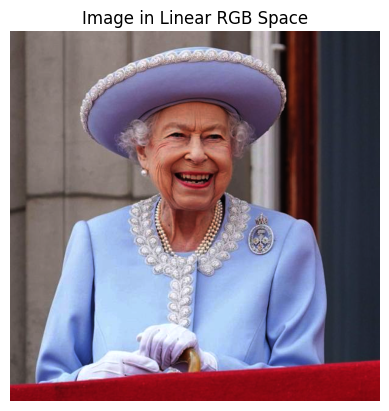

In [35]:
plt.imshow(np.clip(image_linear, 0, 1))  
plt.title("Image in Linear RGB Space")
plt.axis("off")
plt.show()

Now we plot the layers to see how the image has been splitted up in 7 different layers and the criterion is color similarity. From this layering approach it is possible to see which pixels belong to which color clusters. We basically get an idea of what color is each pixel explaining. Remember that the color we see in the layer is the centroid of the cluster. Given that sRGB and RGB treat color differently we have a look at both to see the difference in the clustering. 

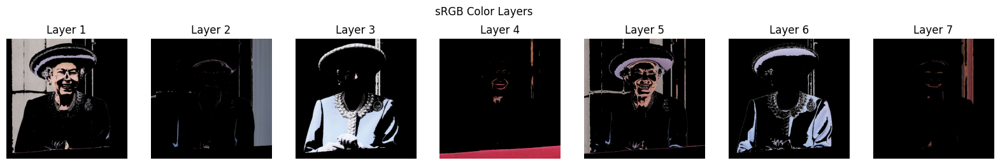

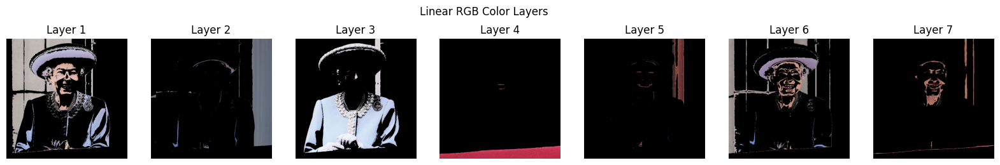

In [40]:
plot_layers(layers_srgb, "sRGB Color Layers")
plot_layers(layers_linear, "Linear RGB Color Layers")

And as last step we can effectively visualize the final chosen pallettes

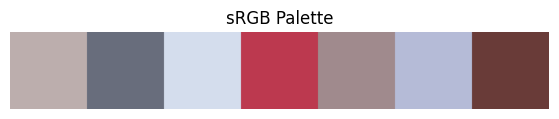

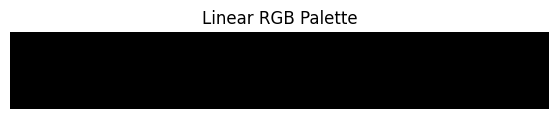

In [41]:
plot_palette(palette_srgb, "sRGB Palette")
plot_palette(palette_linear, "Linear RGB Palette")

What we can say about the two pallettes is that given the sRGB is gamma-compressed, it is better for humans meaning it is giving us a better perception of how humans effectively see this contrast and brightness. The linear one is expected to be black due to that our eyes perceive brightness non-linearly which appear very dark in this case.

### 1.2 CIELab Color Palette
You may have noticed that some clusters in your color palette are featuring colors that are quite different from each other, making editing a bit difficult. This is due sRGB not being a perceptually-uniform color space, which makes perceived and numerical differences between colors differ greatly. Perceptually uniform color spaces, such as CIELab, exploit computational models of human perception to create color spaces where geometric distances roughly correspond to similar distances in the perceptual space. This should ensure better color separation in your palette (Figure 1).

Edit your palette generation algorithm to use CIELab color space. You may use existing MATLAB/Python functions to translate your image from sRGB to CIELab. Compare both methods.

You can now edit the artistic look of your image intuitively by changing the individual color layers! Play around with them and generate some results of your own. You can try shifting the hue of specific layers, or plainly increasing lightness or saturation for specific effects. You should try it in at least 1 image of your own choice. Include the produced palette and filtered layers of the provided `queen.jpg` image as well.

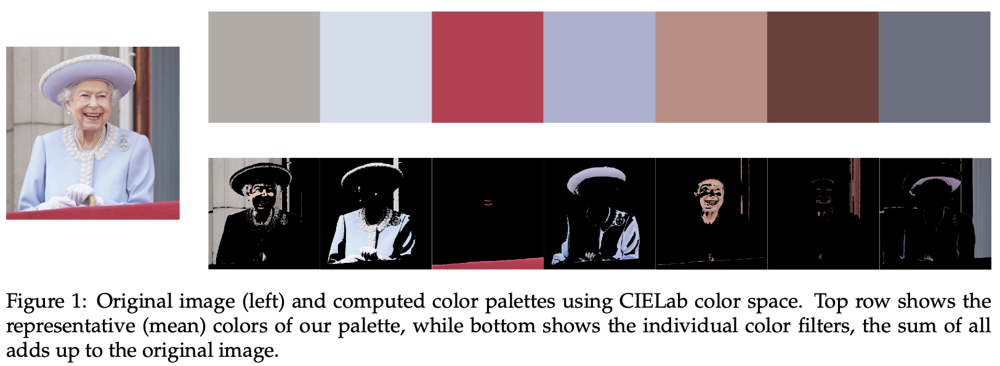


**Bonus [1.5 Points]:** An important tool when editing the colors and overall feel of an image is white balance. As we saw in Assignment #1, obtaining a neutral, calibrated white balance is important for accurate photographic reproduction, but we can also alter it for artistic purposes. Recover your white balance code from Assignment #1 and try increasing or decreasing the temperature of your image after computing your color palette. Try then combining it with your palette-based color editing and other simple point operations we saw in Assignment #1 (contrast, brightness) to create your own tiny Lightroom! Showcase it with a picture of your choice.

In [ ]:
def cielab_processing(image_np, k):

    image_bgr = cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR)
    image_lab = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2LAB)

    lab_reshaped = image_lab.reshape(-1, 3) 
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(lab_reshaped)
    centroids_lab = kmeans.cluster_centers_

    # NOTE: here we convert pallette nad remember the typeeees otherwise CV will complain
    palette_lab = centroids_lab.reshape(-1, 1, 3).astype(np.uint8)
    palette_rgb = cv2.cvtColor(palette_lab, cv2.COLOR_LAB2RGB).reshape(-1, 3)

    segmented_images = []
    labels_2d = labels.reshape(image_np.shape[:2])
    for i in range(k):
        mask = (labels_2d == i)
        layer = np.zeros_like(image_np)
        layer[mask] = cv2.cvtColor(np.uint8([[centroids_lab[i]]]), cv2.COLOR_LAB2RGB)[0, 0]
        segmented_images.append(layer)
    
    return segmented_images, palette_rgb

def modify_pallette(lab_reshaped, image_lab):
    k = 7
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(lab_reshaped)
    centroids_lab = kmeans.cluster_centers_
    labels_2d = labels.reshape(image_np.shape[:2])

    edited_layers = []

    for i in range(k):
        mask = (labels_2d == i).astype(np.uint8) * 255
        
        layer = np.zeros_like(image_lab)
        layer[:, :] = centroids_lab[i]
        
        L, A, B = cv2.split(layer)
        
        if i == 0:  
            A = np.clip(A - 30, 0, 255) 

        modified_lab = cv2.merge([L, A, B])
        modified_rgb = cv2.cvtColor(modified_lab, cv2.COLOR_LAB2RGB)
        masked_layer = cv2.bitwise_and(modified_rgb, modified_rgb, mask=mask)
        edited_layers.append(masked_layer)

    final_artistic = np.zeros_like(image_np)
    for layer in edited_layers:
        mask = np.any(layer != 0, axis=2)
        final_artistic[mask] = layer[mask]
    
    return final_artistic, edited_layers


In [77]:
# Execute your code here
image = Image.open("queen.jpg").convert("RGB")
image_np = np.array(image)

segmented_images, palette_lab = cielab_processing(image_np, 7)

image_bgr = cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR)
image_lab = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2LAB)
lab_reshaped = image_lab.reshape(-1, 3)

final_artistic, edited_layers = modify_pallette(lab_reshaped, image_lab)

image_mine = Image.open("old_car.jpg").convert("RGB")
image_np_mine = np.array(image_mine)

segmented_images_mine, palette_lab_mine = cielab_processing(image_np_mine, 7)


###  <span style="color:orange">  </span>
<span style="color:orange"> **Report.** _Report your results here._ </span>

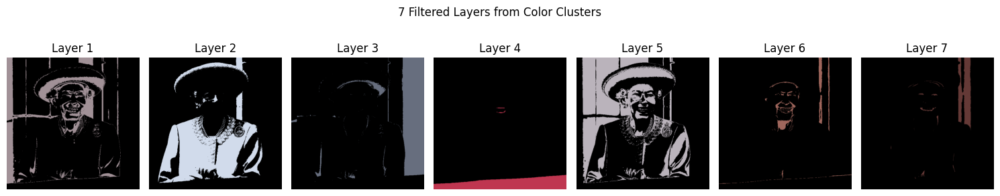

In [ ]:
plt.figure(figsize=(15, 6))
for i, layer in enumerate(segmented_images):
    plt.subplot(2, 7, i + 1)
    plt.imshow(layer)
    plt.title(f"Layer {i+1}")
    plt.axis("off")
plt.suptitle("7 Filtered Layers from Color Clusters")
plt.tight_layout()
plt.show()

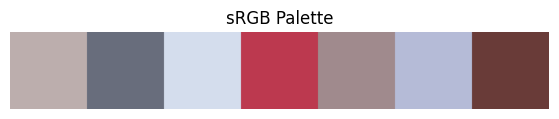

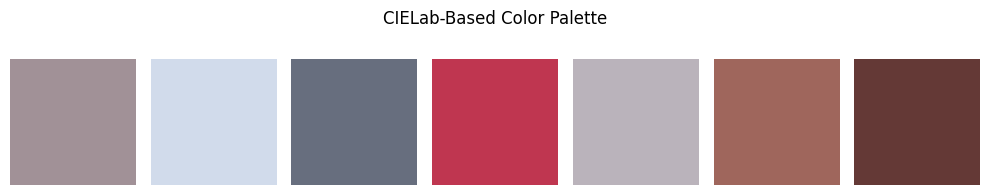

In [69]:
plot_palette(palette_srgb, "sRGB Palette")

plt.figure(figsize=(10, 2))
for i, color in enumerate(palette_lab):
    plt.subplot(1, 7, i + 1)
    plt.imshow(np.ones((10, 10, 3), dtype=np.uint8) * color)
    plt.axis("off")
plt.suptitle("CIELab-Based Color Palette")
plt.tight_layout()
plt.show()

The difference between the two is regarding the uniformity of the pallete. The CIElab palette is perceptually uniform, meaning it reflect even better exactly how human would percieve the color. The sRGB one can create much harder contrast and uneven ones due to the non-linearity perception.

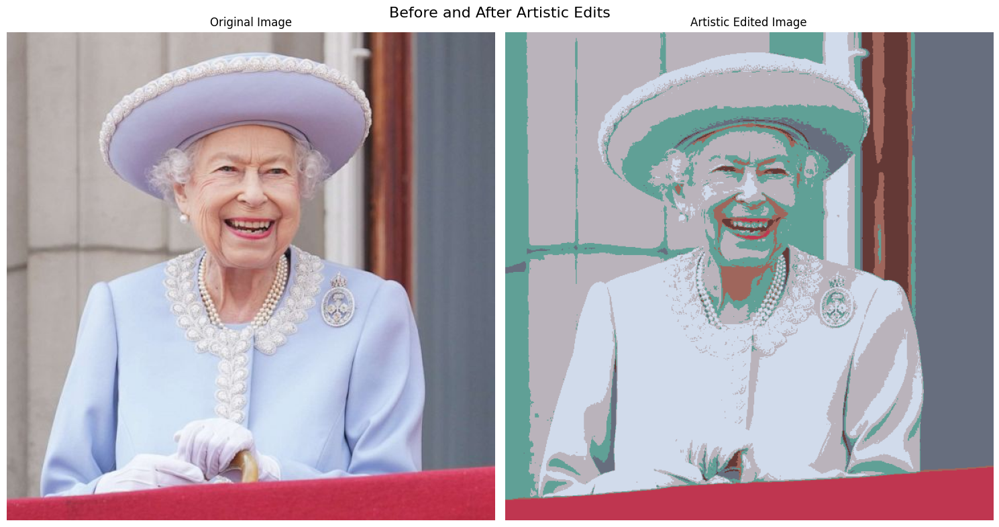

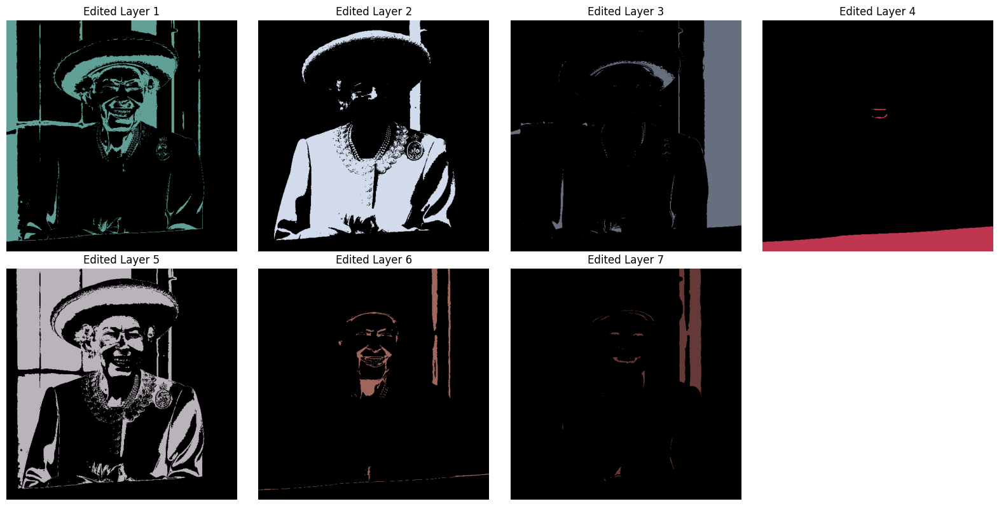

In [ ]:
plt.figure(figsize=(15, 8))

plt.subplot(1, 2, 1)
plt.imshow(image_np)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(final_artistic)
plt.title("Artistic Edited Image")
plt.axis("off")

plt.suptitle("Before and After Artistic Edits", fontsize=16)
plt.tight_layout()
plt.show()

plt.figure(figsize=(16, 8))
for i, layer in enumerate(edited_layers):
    plt.subplot(2, 4, i + 1)
    plt.imshow(layer)
    plt.title(f"Edited Layer {i+1}")
    plt.axis("off")
plt.tight_layout()
plt.show()

In the following scenario I edited only the first cluster and I wanted to make it more green so I took channel A and I subtracted 30 to it so that it would go towards green. It is possible to see it in the first cluster and also in the edited image.

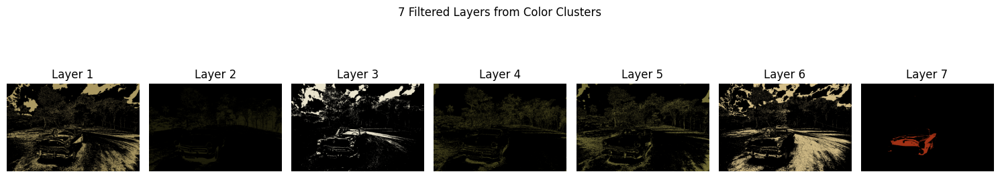

In [78]:
plt.figure(figsize=(15, 6))
for i, layer in enumerate(segmented_images_mine):
    plt.subplot(2, 7, i + 1)
    plt.imshow(layer)
    plt.title(f"Layer {i+1}")
    plt.axis("off")
plt.suptitle("7 Filtered Layers from Color Clusters")
plt.tight_layout()
plt.show()

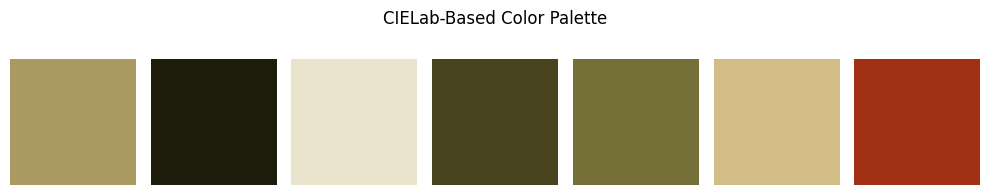

In [79]:
plt.figure(figsize=(10, 2))
for i, color in enumerate(palette_lab_mine):
    plt.subplot(1, 7, i + 1)
    plt.imshow(np.ones((10, 10, 3), dtype=np.uint8) * color)
    plt.axis("off")
plt.suptitle("CIELab-Based Color Palette")
plt.tight_layout()
plt.show()

This was an example with my own image.

## 2 Color Quantization and Lookup Tables (LUTs) [4 Points]
Quantization and color mapping through LUTs are techniques used in image processing to transform the color space of an image, either to reduce the amount of data required to represent the image, or to map colors from one space to another.

Quantization involves reducing the number of colors in an image by mapping similar colors to a smaller set of discrete values. This can be done by dividing the color space into a regular grid, and assigning each pixel to the closest grid point. This process is commonly used in image compression, as it reduces the amount of data required to represent the image, by storing per-pixel color IDs instead of exact colors. However, it can also cause loss of detail and introduce visual artifacts.

LUTs are used to map one set of values to another set of values. In image processing, LUTs are commonly used to map colors from one color space to another. For example, they can be used to convert an RGB image to a grayscale image, by mapping each pixel’s RGB values to a specific grayscale value. LUTs are also widely used in cinema production to apply color grading effects to an image or video, by mapping the original colors to new, adjusted colors, to achieve specific artistic effects.

**Task.** Implement a basic quantization method to reduce the size of the provided image by mapping its pixel values to a set of 32 colors. You may use any method to constrain this color space, except pre-defined MATLAB/Python solutions, of course. A few suggestions are, but not limited to: color clipping, thresholding, clustering, palette-based or euclidean distance-based nearest neighbors. Then, implement a look-up table that transforms your compressed RGB image into a grayscale image. You are also free to choose any method to map your 32 quantized colors to grey values, taking luminance, color difference or hue into account, for example. Try to maximize perceived quality, and make sure to explain in detail your approach for both quantization and LUT color mapping in you report. Show both your quantized color image and your resulting grayscale image after applying your LUT in the provided `queen.jpg` image.

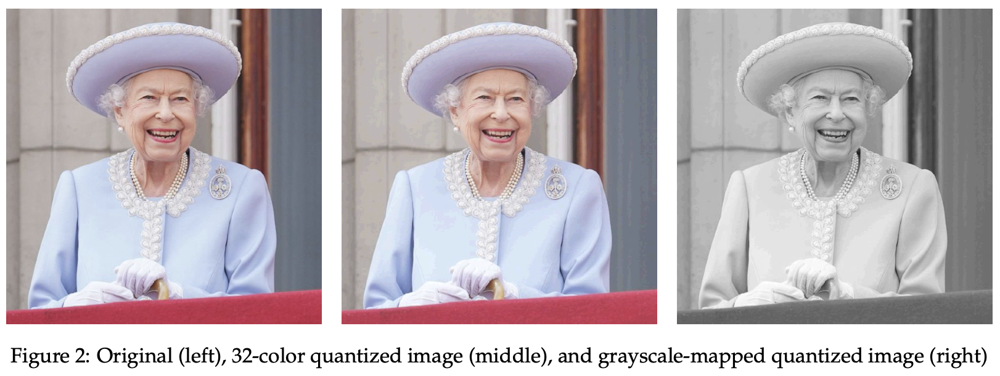

**Bonus [1.5 Points]:** Make your color quantization pipeline perceptually-aware, by exploiting human color and luminance perception to quantize colors more aggressively or making quantization less obvious. Use the Weber-Fechner Law and perceptual color models like CAM or CIELab to improve quantization. Show this improvement comparatively.

In [4]:
# Define your functions here .- you can include comments in your code explaining the steps of your algorithm
def color_quantization_and_lut(image):
    # NOTE : There is written than KMeans can be used to quantize, hence I will procedee with it
    px = image.reshape(-1, 3)
    kmeans = KMeans(n_clusters=32, random_state=42)
    kmeans.fit(px)
    quantized_pixels = kmeans.cluster_centers_[kmeans.labels_]
    quantized_image = quantized_pixels.reshape(image.shape).astype(np.uint8)

    # NOTE: Use suggestion of luminance for binding the 32 colors to the grayscale
    # NOTE: The Luminance base formula is : 0.299*R + 0.587*G + 0.114*B
    cluster_centers = kmeans.cluster_centers_.astype(np.uint8)
    luminance = (0.299 * cluster_centers[:, 0] +
                0.587 * cluster_centers[:, 1] +
                0.114 * cluster_centers[:, 2]).astype(np.uint8)

    # 5. Apply LUT to get grayscale image
    labels = kmeans.labels_
    grayscale_pixels = luminance[labels]
    grayscale_image = grayscale_pixels.reshape(image.shape[:2])

    return image, quantized_image, grayscale_image

In [5]:
# Execute your code here
image = Image.open('queen.jpg')
image = np.array(image)

image, quantized_image, grayscale_image = color_quantization_and_lut(image)

###  <span style="color:orange">  </span>
<span style="color:orange"> **Report.** _Report your results here._ </span>

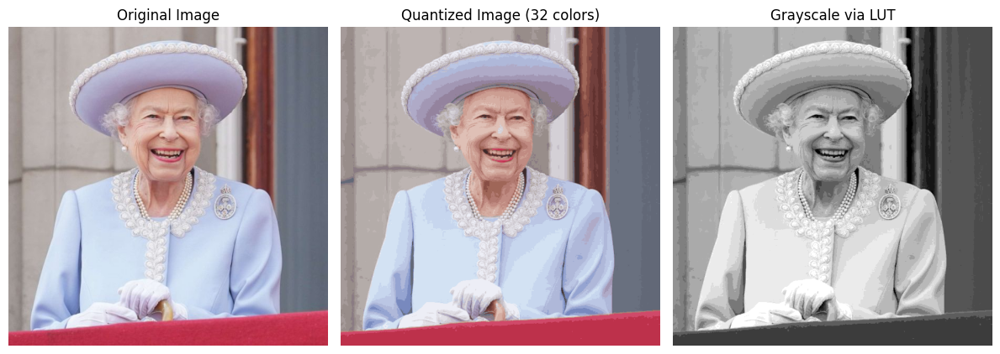

In [6]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(image)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("Quantized Image (32 colors)")
plt.imshow(quantized_image)
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title("Grayscale via LUT")
plt.imshow(grayscale_image, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

To reduce the number of colors in the image, we applied KMeans clustering with 32 clusters. The RGB pixel values of the original image were reshaped into a 2D array, where each row corresponds to a pixel in the image.

Once the image was quantized to 32 RGB colors, we built a lookup table (LUT) to map each of these 32 colors to a grayscale value.

To ensure perceptual accuracy, we used the luminance formula, which takes into account human sensitivity to different colors:

## 3 Gaussian and Laplacian Pyramids [5 Points]
Multi-scale image representations (also called pyramids) transform an image into a set of images representing different frequency bands in the original image. While a Gaussian pyramid stores different low-pass versions of the original image, every level of Laplacian pyramid stores a specific range of spatial frequencies which correspond to band-passed versions of the original images. When all levels of Laplacian pyramid are added the result is the original image. This is not true for Gaussian pyramids.

**Task.** Implement a function to compute a Laplacian pyramid of an input image. The code should decompose the image into 4 levels. You are allowed to use MATLAB/Python functions for spatial filtering and resizing images. The most straightforward way to realize this task is to first build the Gaussian pyramid, and then subtract the consecutive levels to obtain the individual levels of the Laplacian pyramid (the procedure we described during the lecture). Compute the Laplacian pyramid of the two provided images (`sad.jpg` and `happy.jpg`) and show the different levels of your pyramid in your report.

In [ ]:
# Define your functions here .- you can include comments in your code explaining the steps of your algorithm

def build_laplacian_pyramid(img, levels):
    gaussian_pyramid = [img.copy()]
    for _ in range(levels):
        img = cv2.pyrDown(img)
        gaussian_pyramid.append(img)

    laplacian_pyramid = []
    for i in range(levels):
        size = (gaussian_pyramid[i].shape[1], gaussian_pyramid[i].shape[0])
        gaussian_upsampled = cv2.pyrUp(gaussian_pyramid[i + 1], dstsize=size)
        laplacian = cv2.subtract(gaussian_pyramid[i], gaussian_upsampled)
        laplacian_pyramid.append(laplacian)

    laplacian_pyramid.append(gaussian_pyramid[-1])
    
    return laplacian_pyramid


def show_pyramid(pyramid, title):
    max_height = max(level.shape[0] for level in pyramid)

    # NOTE: WHYYY is it so hard to plot it in scale.. had to search for this padding method
    padded_levels = []
    for level in pyramid:
        h, w = level.shape[:2]
        if len(level.shape) == 2:  
            padded = np.zeros((max_height, w), dtype=np.uint8)
            padded[:h, :w] = level
        else:  
            padded = np.zeros((max_height, w, 3), dtype=np.uint8)
            padded[:h, :w, :] = level
        padded_levels.append(padded)

    stacked_image = np.hstack(padded_levels)

    if stacked_image.ndim == 3 and stacked_image.shape[2] == 3:
        stacked_image = cv2.cvtColor(stacked_image, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(15, 5))
    plt.imshow(np.clip(stacked_image, 0, 255).astype(np.uint8))
    plt.title(title)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

In [50]:
# Execute your code here
img_sad = cv2.imread('sad.jpg')
img_happy = cv2.imread('happy.jpg')

# NOTE : in order to create 4 layers, pass 3 because it is index-based it starts from 0
laplacian_sad = build_laplacian_pyramid(img_sad, 3)
laplacian_happy = build_laplacian_pyramid(img_happy, 3)

###  <span style="color:orange">  </span>
<span style="color:orange"> **Report.** _Report your results here._ </span>

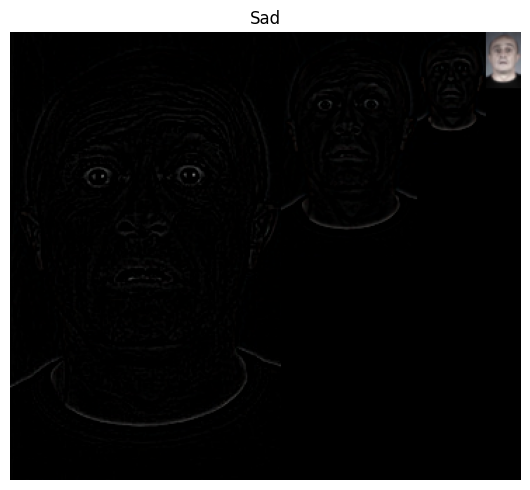

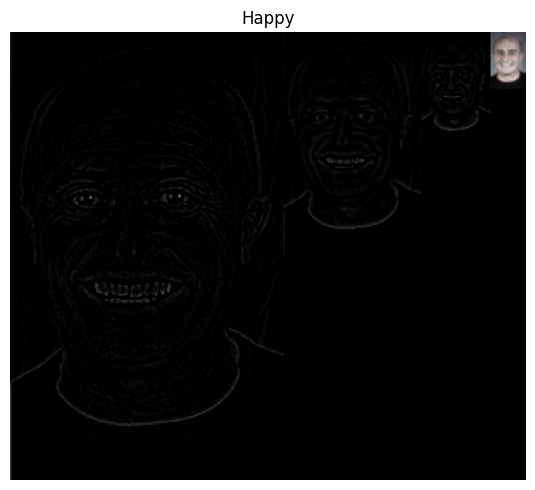

In [15]:
show_pyramid(laplacian_sad, "Sad")
show_pyramid(laplacian_happy, "Happy")

Laplacian pyramids capture at each layer a different band-pass filtered image. To complete the task I followed the hint in the assignment description. I cerated a Gaussian for the 4 layers downsamplit it everytime. Then in order to create the laplacian I subtract the upsample version of the lower layer of the current one. The last image of the lapalacian pyramid is chosen to be the last gaussian one, because there is no upsampled version to make the subtraction. If all the laplacian level would be reconstructed together then it would be possible to almost reconstruct the original image.

## 4 Hybrid Images [3 Points]
A fun application of Gaussian and Laplacian pyramids is the creation of hybrid images. In essence, the human visual system is sensitive to high-frequency content of the image at close distances, but the further we move from the image our sensitivity and ability to resolve high-frequency content diminishes, and we better perceive low-spatial frequencies of the image. This can be exploited to create images which combine the high frequency component of one image with the low frequency component of another, resulting in an image that changes its appearance depending on the distance from which it is observed. A simple way of creating a hybrid image is to combine two different levels of Laplacian pyramids constructed for the input images. Another simple way is to filter one image with a low-pass filter and the other with complementary high-pass filter, and add the images together.

**Task.** Use one of the methods to compute hybrid images out of the two images `sad.jpg` and `happy.jpg` provided with the assignment. You should be able to get a similar effect to what you can see in Figure 3. If you use the first approach to computing hybrid images, play around with which levels to combine. When you use the second method, experiment with different cut-off frequencies for both filters. In both cases, see how the choices influence the quality of the results and the distances from which the images should be observed.

In the report provide the final image with information about the ideal viewing conditions:
- the size of the image on the screen
- the distance to see sad face
- the viewing distance to see happy face

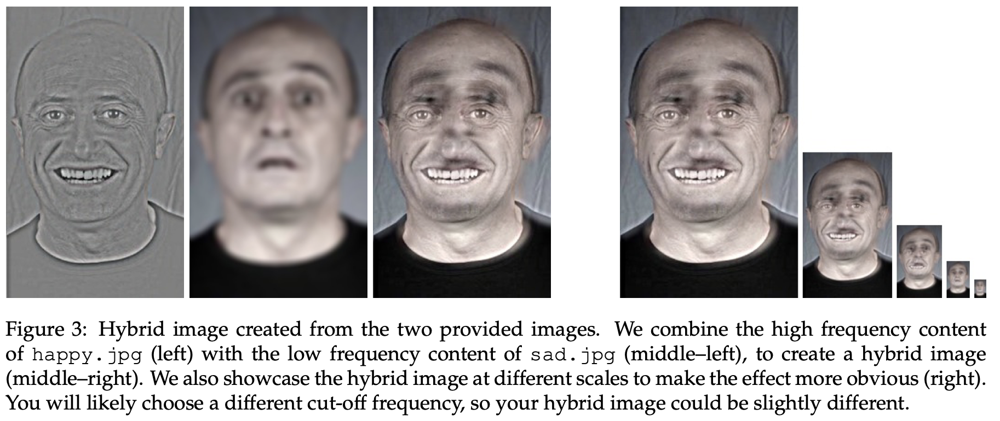

In [81]:
# Define your functions here .- you can include comments in your code explaining the steps of your algorithm
def create_hybrid_image(low_img, high_img, sigma_low, sigma_high):
    
    # NOTE: I couldn't get a good image and found that is better to convert
    low_img_float = low_img.astype(np.float32)
    high_img_float = high_img.astype(np.float32)
    
    # NOTE : apply low-pass filter
    low_pass = cv2.GaussianBlur(low_img_float, (0, 0), sigmaX=sigma_low, sigmaY=sigma_low)
    
    # NOTE: apply high-pass filter
    high_blur = cv2.GaussianBlur(high_img_float, (0, 0), sigmaX=sigma_high, sigmaY=sigma_high)
    high_pass = high_img_float - high_blur + 128  
    
    hybrid = np.clip(low_pass + high_pass - 128, 0, 255).astype(np.uint8)
    high = np.clip(high_pass, 0, 255)
    
    return hybrid, low_pass.astype(np.uint8), high.astype(np.uint8)

def show_scale(hybrid_img, scales=[1.0, 0.75, 0.5, 0.35, 0.25]):
    images = []
    for scale in scales:
        h, w = hybrid_img.shape[:2]
        new_size = (int(w * scale), int(h * scale))
        resized = cv2.resize(hybrid_img, new_size, interpolation=cv2.INTER_AREA)
        images.append(resized)
        
    total_width = sum(img.shape[1] for img in images)
    max_height = max(img.shape[0] for img in images)
    
    strip = 255 * np.ones((max_height, total_width, 3), dtype=np.uint8)
    
    current_x = 0
    for img in images:
        h, w = img.shape[:2]
        strip[:h, current_x:current_x + w] = img
        current_x += w
        
    plt.figure(figsize=(15,5))
    plt.imshow(cv2.cvtColor(strip, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Hybrid Image at Different sizes")
    plt.show()


In [91]:
# Execute your code here
happy = cv2.imread("happy.jpg")
sad = cv2.imread("sad.jpg")

# NOTE: The images apparently are not the same size so I have to resize em
happy = cv2.resize(happy, (256, 256))
sad = cv2.resize(sad, (256, 256))

###  <span style="color:orange">  </span>
<span style="color:orange"> **Report.** _Report your results here._ </span>

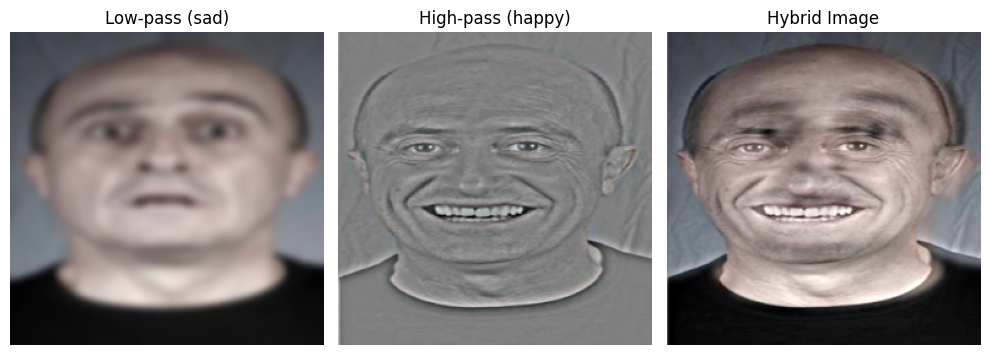

In [99]:
hybrid_img, low_pass_img, high_pass_img = create_hybrid_image(sad, happy, 3, 4)

titles = ["Low-pass (sad)", "High-pass (happy)", "Hybrid Image"]
imgs = [low_pass_img, high_pass_img, hybrid_img]

plt.figure(figsize=(10, 15))
for i in range(3):
    plt.subplot(1, 3, i+1)
    img_rgb = cv2.cvtColor(imgs[i], cv2.COLOR_BGR2RGB)
    plt.imshow(img_rgb)
    plt.title(titles[i])
    plt.axis("off")
plt.tight_layout()
plt.show()

This is the closest I can get by playing with the sigmas to the one in Figure 2. I looked weird stepping behind like 5 6 meters to look at it in University...

Anyway everything that happens is already explain in the Assignment description so I will not be very verbose, I applied a low pass filter to the sad image and a high pass filter to the happy one, I then added the images together and the hybrid image came out.

In [95]:
happy_old = cv2.imread("happy.jpg")
sad_old = cv2.imread("sad.jpg")

height_happy_old, width_happy_old = happy_old.shape[:2]
print(f"Image size happy old : {width_happy_old} x {height_happy_old} pixels")

height_sad_old, width_sad_old = sad.shape[:2]
print(f"Image size sad old: {width_sad_old} x {height_sad_old} pixels")

height_happy, width_happy = happy.shape[:2]
print(f"Image size happy : {width_happy} x {height_happy} pixels")

height_sad, width_sad = sad.shape[:2]
print(f"Image size sad: {width_sad} x {height_sad} pixels")

Image size happy old : 193 x 316 pixels
Image size sad old: 256 x 256 pixels
Image size happy : 256 x 256 pixels
Image size sad: 256 x 256 pixels


Due to mismatch in the images I had to resize them...

Ideal viewing conditions : 

- Given the final hybrid image being 256×256 pixels, from official DELL specification websites, my screen is ~34cm wide and currently has 1920 pixels horizontally (checked in settings). SO if we calculate the pixels per centimeter we end up with $$\text {pixel per cm} = \frac{1920\ \text{pixels}}{34\ \text{cm}} \approx 56.47\ \text{pixels/cm}$$ Hence given that the image is 256x256 we can calculate the image width in cm: $$\text{Image width} = \frac{256\ \text{pixels}}{56.47\ \text{pixels/cm}} \approx 4.53\ \text{cm}$$ To conclude on a screen that as wide as 34 cm and with a current resolution of 1920 pixels, a 4.5cm x 4.5cm image would be in its ideal size. 
 
- Viewing distance to see the sad face [physical try on the above image(I literally stepped back in the middle of university)]: from ~4.5 mt onwards
- Viewing distance to see the happy face [physical try on the above image(I literally stepped back in the middle of university)]: the opposite, from ~ 4 mt to nose to screen.

Proof to that: 

![centimeters of the image](centimeter_image.jpg)
![distance from image](distance_from_image.jpg)


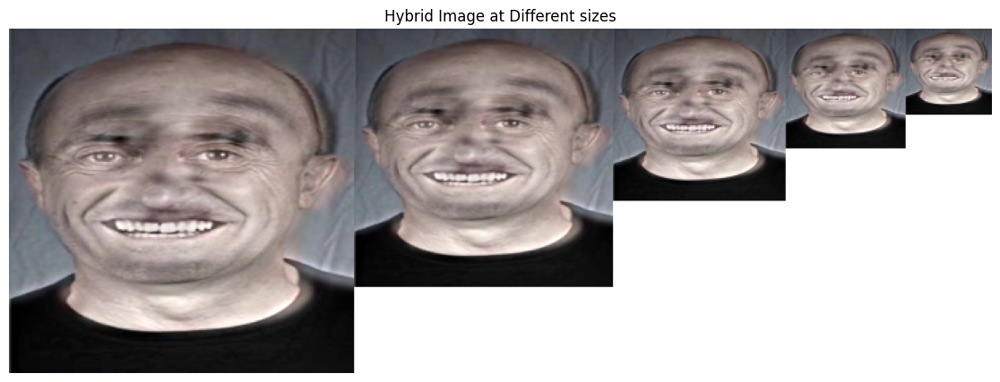

In [88]:
show_scale(hybrid_img, scales=[1.0, 0.75, 0.5, 0.35, 0.25])

Also plotted this as said in the attached image on assignemnt description to make it more obvious

## 5 Bonus: Create your own Instagram Filter! [2 Points]
You may use now your newly acquired tools in image filtering and color manipulation to create your own Instagram filter! A possible approach can be to select a specific artist or photographer you like to emulate their style, or pick a known filter you want to reproduce. You can then employ specific color mappings or filtering methods from this and previous assignments to develop your own artistic rendition. You may also try your hand at color harmonization, as seen in Lecture #8. We only impose two rules:
1. Your filter should be plug-and-play, that is, we have to be able to use it on any image, regardless of colors, image size, etc.
2. It should be implemented as a single compact MATLAB/Python function so that we can test it out ourselves.

Otherwise, we give you full freedom to use any tool you want! Apply it to several of your own images, and showcase your solution with step-by-step partial result images illustrating the process from base image to your final result. Remember to include your source of inspiration as well in the report. Note: Copy pasting the grayscale effect developed in Exercise 2 will not render extra points. You can see an example filter developed by us in Figure 4.

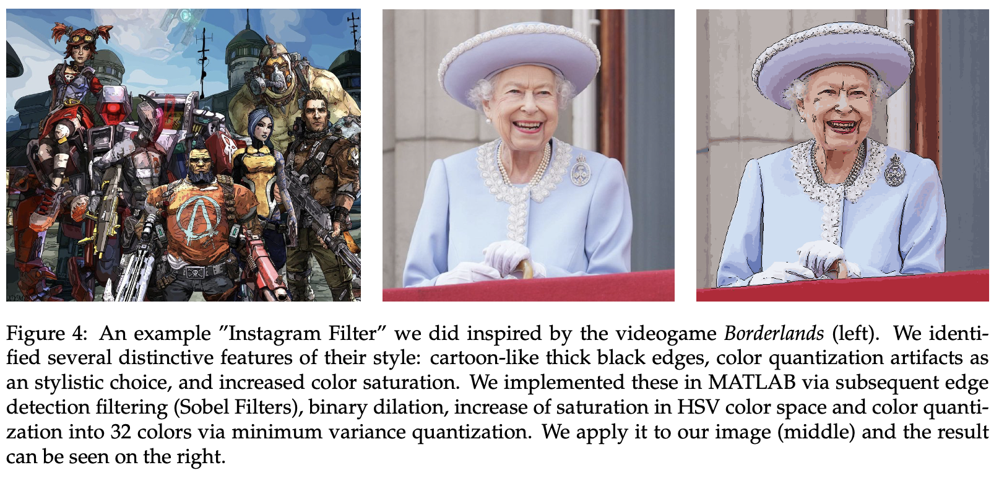

In [ ]:

def color_transfer(source, target):
    source_lab = cv2.cvtColor(source, cv2.COLOR_BGR2LAB).astype(np.float32)
    target_lab = cv2.cvtColor(target, cv2.COLOR_BGR2LAB).astype(np.float32)

    # NOTE: Compute the mean and std of each channel
    mean_src, std_src = cv2.meanStdDev(source_lab)
    mean_tgt, std_tgt = cv2.meanStdDev(target_lab)

    mean_src = mean_src.reshape(1, 1, 3)
    std_src = std_src.reshape(1, 1, 3)
    mean_tgt = mean_tgt.reshape(1, 1, 3)
    std_tgt = std_tgt.reshape(1, 1, 3)

    # NOTE: Subtract source mean, scale by target, add target mean
    transferred = (source_lab - mean_src)
    transferred = (transferred * (std_tgt / std_src)) + mean_tgt

    transferred = np.clip(transferred, 0, 255).astype(np.uint8)
    result = cv2.cvtColor(transferred, cv2.COLOR_LAB2BGR)

    return result


###  <span style="color:orange">  </span>
<span style="color:orange"> **Report.** _Report your results here._ </span>

So the idea behind the filter is to do a per-channel color transfer. In this case I use the LAB color space. The lab color space has three chanels, L, A and B where the L stands for lightness, A is a channel tendend to green/red while B is a blue/yellow channel. 

This is what is written in the slides : 

    • Match statistics (standard deviation and mean) between reference and input
    • Consider each channel seperatelly using Lab space

And it is exactly what I am doing. So i first compute the mean and the standard deviation of each channel, then I subtract the mean of the source image to the source image itself and scale it by the ratio of the target standard deviation to the source standardard deviation. I finally add the target mean. 

Essentially following the slides formula: 
$$
I_o = \frac{\sigma_r}{\sigma_i} (I_i - \mu_i) + \mu_r
$$

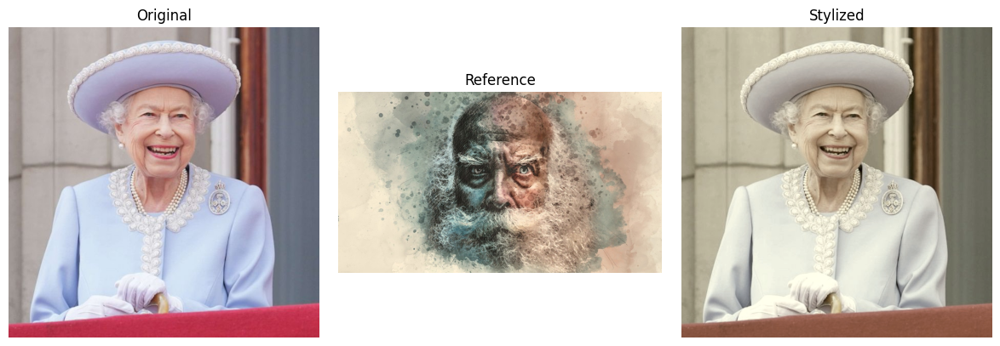

In [ ]:

# Load your images
source = cv2.imread("queen.jpg")   
target = cv2.imread("old_man.jpg")    

# Apply color transfer
output = color_transfer(source, target)

titles = ["Original", "Reference", "Stylized"]
images = [source, target, output]

plt.figure(figsize=(12, 4))
for i in range(3):
    plt.subplot(1, 3, i + 1)
    plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
    plt.title(titles[i])
    plt.axis("off")
plt.tight_layout()
plt.show()

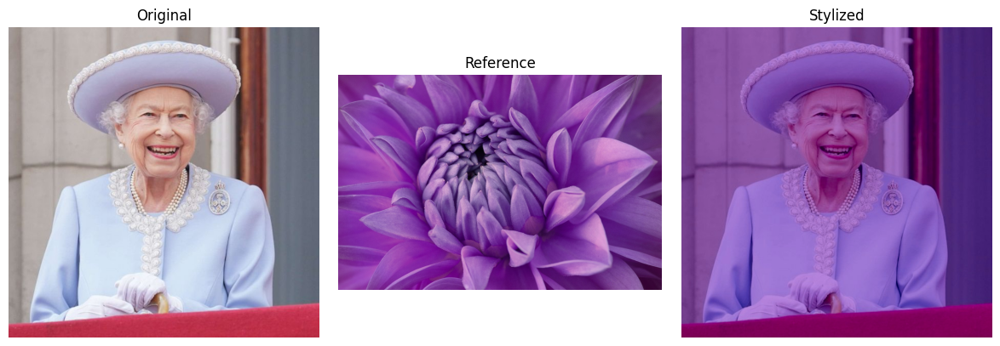

In [ ]:
# Load your images
source = cv2.imread("queen.jpg")   
target = cv2.imread("purple_flower.jpg")    

output = color_transfer(source, target)

titles = ["Original", "Reference", "Stylized"]
images = [source, target, output]

plt.figure(figsize=(12, 4))
for i in range(3):
    plt.subplot(1, 3, i + 1)
    plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
    plt.title(titles[i])
    plt.axis("off")
plt.tight_layout()
plt.show()

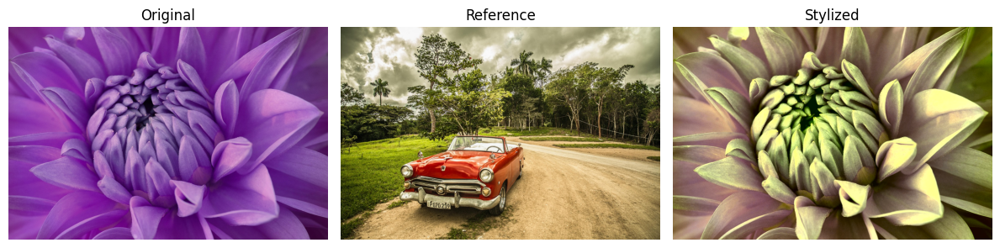

In [ ]:
# Load your images
source = cv2.imread("purple_flower.jpg")   
target = cv2.imread("old_car.jpg")    

output = color_transfer(source, target)

titles = ["Original", "Reference", "Stylized"]
images = [source, target, output]

plt.figure(figsize=(12, 4))
for i in range(3):
    plt.subplot(1, 3, i + 1)
    plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
    plt.title(titles[i])
    plt.axis("off")
plt.tight_layout()
plt.show()

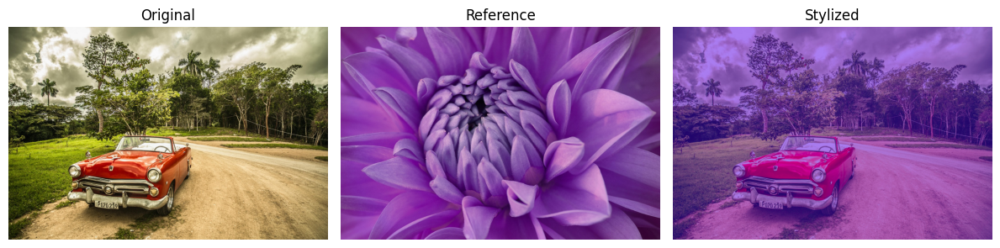

In [ ]:
source = cv2.imread("old_car.jpg")   
target = cv2.imread("purple_flower.jpg")    

output = color_transfer(source, target)

titles = ["Original", "Reference", "Stylized"]
images = [source, target, output]

plt.figure(figsize=(12, 4))
for i in range(3):
    plt.subplot(1, 3, i + 1)
    plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
    plt.title(titles[i])
    plt.axis("off")
plt.tight_layout()
plt.show()